#MobileNet-based UNet for Semantic Segmentation

##Imports

In [6]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
import torchvision
import torch.nn.functional as F
from torch.autograd import Variable

from PIL import Image
import cv2
import albumentations as A

import time
import os
from tqdm.notebook import tqdm
!pip install -q torchsummary

from torchsummary import summary

import torchvision.transforms as transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Mount Drive

In [10]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


Extract Dataset

In [ ]:
!unzip '/content/drive/MyDrive/A3/A3_Dataset.zip'

Define Dataloader Class

In [15]:
class CustomDataset(Dataset):
    def __init__(self, data_dir, suffix, transform=None):
        self.data_dir = data_dir
        self.suffix = suffix
        self.image_list = sorted(os.listdir(os.path.join(data_dir, f'images_prepped_{self.suffix}')))
        self.mask_list = sorted(os.listdir(os.path.join(data_dir, f'annotations_prepped_{self.suffix}')))
        self.transform = transform

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, index):
        image_path = os.path.join(self.data_dir, f'images_prepped_{self.suffix}', self.image_list[index])
        mask_path = os.path.join(self.data_dir, f'annotations_prepped_{self.suffix}', self.mask_list[index])

        image = Image.open(image_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')

        if self.transform is not None:
            image = np.array(image)
            mask = np.array(mask)
            augmented = transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']
            
        return image, mask

Define Augmentation logic

In [6]:
from albumentations import HorizontalFlip,RandomScale,GaussNoise,Perspective,Rotate

def augment_data(images, masks, save_path, augment=True):
    H = 288
    W = 288

    for x, y in tqdm(zip(images, masks), total=len(images)):
        name = x.split("/")[-1].split(".")
        """ Extracting the name and extension of the image and the mask. """
        image_name = name[0]
        image_extn = name[1]

        name = y.split("/")[-1].split(".")
        mask_name = name[0]
        mask_extn = name[1]

        """ Reading image and mask. """
        x = cv2.imread(x, cv2.IMREAD_COLOR)
        y = cv2.imread(y, cv2.IMREAD_COLOR)

        """ Augmentation """
        if augment == True:

            aug = HorizontalFlip(p=1.0)
            augmented = aug(image=x, mask=y)
            x1 = augmented["image"]
            y1 = augmented["mask"]

            aug = A.Rotate(limit=(-45, 45), p=1.0)
            augmented = aug(image=x, mask=y)
            x2 = augmented['image']
            y2 = augmented['mask']

            aug = A.RandomScale(scale_limit=(-0.5, 0.5), p=1.0)
            augmented = aug(image=x, mask=y)
            x3 = augmented['image']
            y3 = augmented['mask']

            aug = HorizontalFlip(p=1.0)
            augmented = aug(image=x, mask=y)
            x4 = augmented['image']
            y4 = augmented['mask']

            aug = A.GaussNoise(var_limit=(0.01, 0.1), p=1.0)
            augmented = aug(image=x, mask=y)
            x5 = augmented['image']
            y5 = augmented['mask']

            
            aug = A.Perspective(p=1.0)
            augmented = aug(image=x, mask=y)
            x6 = augmented['image']
            y6 = augmented['mask']

            save_images = [x, x1, x2, x3, x4, x5, x6]
            save_masks =  [y, y1, y2, y3, y4, y5, y6]

        

        """ Saving the image and mask. """
        idx = 0
        for i, m in zip(save_images, save_masks):
            i = cv2.resize(i, (W, H))
            m = cv2.resize(m, (W, H))

            if len(images) == 1:
                tmp_img_name = f"{image_name}.{image_extn}"
                tmp_mask_name = f"{mask_name}.{mask_extn}"
            else:
                tmp_img_name = f"{image_name}_{idx}.{image_extn}"
                tmp_mask_name = f"{mask_name}_{idx}.{mask_extn}"

            image_path = os.path.join(save_path, "images_prepped_train/", tmp_img_name)
            mask_path = os.path.join(save_path, "annotations_prepped_train/", tmp_mask_name)

            cv2.imwrite(image_path, i)
            cv2.imwrite(mask_path, m)

            idx += 1

Prepare Dataset

In [22]:
from tqdm import tqdm
from glob import glob



save_path ="/content/drive/MyDrive/A3/augmented"
images = sorted(glob("/content/A3_Dataset/dataset1/images_prepped_train/*"))
masks = sorted(glob("/content/A3_Dataset/dataset1/annotations_prepped_train/*"))
augment_data(images, masks, save_path, augment=True)



100%|██████████| 367/367 [01:10<00:00,  5.19it/s]


In [18]:
batch_size = 8
transform = A.Compose([
    A.Resize(288, 288, interpolation=cv2.INTER_NEAREST)
])

data_dir_train = '/content/drive/MyDrive/A3/augmented'
data_dir_test = '/content/A3_Dataset/dataset1'
train_suffix = 'train'  # Suffix for training data
test_suffix = 'test'  # Suffix for testing data
save_path ="/content/drive/MyDrive/A3/augmented"

dataset = CustomDataset(save_path, suffix=train_suffix, transform=transform)
test_dataset = CustomDataset(data_dir_test, suffix=test_suffix, transform=transform)
print(len(test_dataset))
# Calculate dataset sizes
dataset_size = len(dataset)
train_size = int(0.8 * dataset_size)
val_size = dataset_size - train_size
print(train_size,val_size)
# Split dataset into training and validation sets
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

101
2055 514


In [9]:
print(type(val_dataloader),type(train_dataloader))

images, masks= next(iter(train_dataloader))


# Print the shape of the images and labels
print(images.shape)
print(masks.shape)

<class 'torch.utils.data.dataloader.DataLoader'> <class 'torch.utils.data.dataloader.DataLoader'>
torch.Size([8, 288, 288, 3])
torch.Size([8, 288, 288])


Display Samples

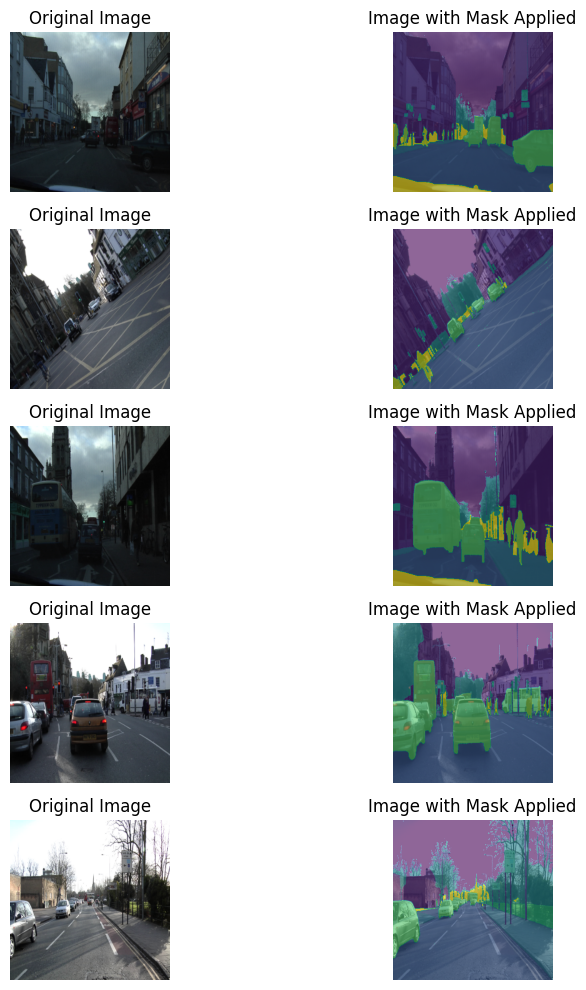

In [9]:


import matplotlib.pyplot as plt

def visualize_samples(images, masks, n_samples=5):
    fig, axes = plt.subplots(nrows=n_samples, ncols=2, figsize=(10, 10))
    
    for i in range(n_samples):
        # Plot the original image
        axes[i, 0].imshow(images[i])
        axes[i, 0].set_title('Original Image')
        
        # Plot the image with mask applied
        axes[i, 1].imshow(images[i])
        axes[i, 1].imshow(masks[i], alpha=0.6, cmap='viridis')
        axes[i, 1].set_title('Image with Mask Applied')
        
        # Remove axis labels
        axes[i, 0].axis('off')
        axes[i, 1].axis('off')
    
    # Adjust the spacing between subplots
    fig.tight_layout()
    
    # Show the plot
    plt.show()

# Assuming 'images' and 'masks' are your training data arrays
visualize_samples(images, masks, n_samples=5)



Display Transformed DataSize

In [10]:
print('Size of Transformed dataset')
print('Train Size   : ', len(train_dataloader.dataset))
print('Val Size     : ', len(val_dataloader.dataset))
#print('Test Size    : ', len(test_dataloader.dataset))

Size of Transformed dataset
Train Size   :  2055
Val Size     :  514


Check Original Datasize

In [11]:
name = []
def count_files_in_directory(directory):
    count = 0
    for _, _, filenames in os.walk(directory):
        count += len(filenames)
    return count

train_org = count_files_in_directory('/content/A3_Dataset/dataset1/images_prepped_train')
test_org = count_files_in_directory('/content/A3_Dataset/dataset1/images_prepped_test')

print('Size of UnTransformed Dataset')
print('Total Train Images: ', int(0.8*train_org))
print('Total Val Images: ', train_org-int(0.8*train_org))
print('Total Test Images: ', test_org)


Size of UnTransformed Dataset
Total Train Images:  293
Total Val Images:  74
Total Test Images:  101


Load Model

In [1]:
!pip install segmentation_models_pytorch
import segmentation_models_pytorch as smp

model = smp.Unet(
    encoder_name='mobilenet_v2',
    encoder_weights='imagenet',
    in_channels=3,
    classes=12,
    activation=None,
    encoder_depth=5,
    decoder_channels=[256, 128, 64, 32, 16]
)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 kB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 23.9 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16427 sha256=98c00522622e53294e46e255220e4e08f2a0ec98d2c83b7d0c3e1d520a235784
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60945 sha256=9d49b0a5a02505fe66d970ad0ee1992a9a67953e8e8790af83fa0eff9dd939ba
  Stored in directory: /root/.cache/pip/w

Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 84.1MB/s]


Define Funactions to compute Accuracy and IoU

In [2]:
# Calculate pixel accuracy over a batch of images
def pixel_accuracy(output, mask):
    with torch.no_grad():
        
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        #print(output.shape,mask.shape)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy

In [3]:
# Calculate mean Intersection-over-Union over a batch of images
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=12):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes): #loop per pixel class
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0: #no exist label in this loop
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union +smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

Training Loop

In [4]:
# Inner loop for running the model for 1 epoch over a given loader

def run_1_epoch(model, loss_fn, loader, optimizer = None, train = False):
  
  if train:
    model.train()
  else:
    model.eval()


  total_correct_preds = 0
  
  total_loss = 0

  # Number of images we can get by the loader
  total_samples_in_loader = len(loader.dataset)
  
  # number of batches we can get by the loader 
  total_batches_in_loader = len(loader)

  for image_batch, labels in tqdm(loader):
    image_batch = image_batch.permute(0, 3, 1, 2)
    # Transfer image_batch to GPU if available
    image_batch = image_batch.to(device)
    # Assuming your target tensor is called 'target'
    labels = labels.long()
    labels = labels.to(device)
    # Zeroing out the gradients for parameters
    if train:
      assert optimizer is not None, "Optimizer must be provided if train=True"
      optimizer.zero_grad()
    # Forward pass on the input batch
    output = model(image_batch.float())
    # Acquire predicted class indices
    _, predicted = torch.max(output.data, 1) # the dimension 1 corresponds to max along the rows 
    # Compute the loss for the minibatch
    loss = loss_function(output, labels)
    # Backpropagation
    if train:
      loss.backward()
    # Update the parameters using the gradients
    if train:
      optimizer.step()
    # Extra variables for calculating loss and accuracy
    # count total predictions for accuracy calcutuon for this epoch
    #total_correct_preds += (predicted == labels).sum().item()
    total_loss += loss.item()

  loss = total_loss / total_batches_in_loader
  accuracy = pixel_accuracy(output, labels)
  mean_IoU = mIoU(output, labels)

  return loss, accuracy, mean_IoU

Parameters

In [7]:
# Select a loss function
loss_function = torch.nn.CrossEntropyLoss()

# Select an optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Define the learning rate scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=40, gamma=0.1)
# For more on schedulers please visit:
# https://towardsdatascience.com/a-visual-guide-to-learning-rate-schedulers-in-pytorch-24bbb262c863

# Set the number of epochs
# This variable is used in the main training loop
epochs = 10

model.to(device);

Lists and paths

In [8]:
# Initializing variables for starting a new training
# Some helper variables

train_accuracies = []
val_accuracies = []

train_losses = []
val_losses = []

train_mIoUs = []
val_mIoUs = []

val_mIoU_max = -1

checkpoint_path = '/content/drive/MyDrive/A3/checkpoints/checkpoint_norm_aug_tensorboard.pth'
best_val_checkpoint_path = '/content/drive/MyDrive/A3/checkpoints/best_val_checkpoint_norm_aug_tensorboard.pth'

# Start epoch is zero for new training
start_epoch = 0

Training Loop

In [28]:
# Main training and validation loop for n number of epochs
for epoch in range(start_epoch, epochs):

  # Train model for one epoch
  early_stop_count=0;
  # Get the current learning rate from the optimizer
  current_lr = optimizer.param_groups[0]['lr']

  print("Epoch %d: Train \nLearning Rate: %.6f"%(epoch, current_lr))
  train_loss, train_accuracy, train_mIoU  = run_1_epoch(model, loss_function, train_dataloader, optimizer, train= True)

  # Update the learning rate scheduler 
  scheduler.step()

  # Lists for train loss and accuracy for plotting
  train_losses.append(train_loss)
  train_accuracies.append(train_accuracy)
  train_mIoUs.append(train_mIoU)

  # Validate the model on validation set
  print("Epoch %d: Validation"%(epoch))
  with torch.no_grad():
    val_loss, val_accuracy, val_mIoU  = run_1_epoch(model, loss_function, val_dataloader, optimizer, train= False)
  
  # Lists for val loss and accuracy for plotting
  val_losses.append(val_loss)
  val_accuracies.append(val_accuracy)
  val_mIoUs.append(val_mIoU)

  # The "add_scalar" function adds a new metric to the tensorboard log
  # It is gnerally given 3 arguments:
  # tag: Name of the metric
  # scalar_value = the value of the metric to record
  # global_step = on which milestone to record the scalar value which in our
  # case is the epoch
  # writer.add_scalar(tag = "Loss/train", scalar_value = train_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/train", scalar_value = train_accuracy, global_step = epoch)

  # writer.add_scalar(tag = "Loss/val", scalar_value = val_loss, global_step = epoch)
  # writer.add_scalar(tag = "accuracy/val", scalar_value = val_accuracy, global_step = epoch)

  print('train loss: %.4f'%(train_loss))
  print('val loss: %.4f'%(val_loss))
  print('train_accuracy %.2f' % (train_accuracy))
  print('val_accuracy %.2f' % (val_accuracy))
  print('train_IoU %.2f'%(train_mIoU))
  print('val_IoU %.2f'%(val_mIoU))
  
  # Save model if validation accuracy for current epoch is greater than 
  # all the previous epochs 
  if val_mIoU > val_mIoU_max:
    val_mIoU_max = val_mIoU
    print("New max val mean IoU Acheived %.2f. Saving model.\n\n"%(val_mIoU_max))

    checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }
    torch.save(checkpoint, best_val_checkpoint_path)
    early_stop_count=0;

  else:

    print("val mean IoU did not increase from %.2f\n\n"%(val_mIoU_max))
    #using early stopping
    early_stop_count=early_stop_count+1;


# Save checkpoint for the last epoch
  checkpoint = {
    'model': model.state_dict(),
    'optimizer': optimizer.state_dict(),
    'scheduler': scheduler.state_dict(),
    'trianed_epochs': epoch,
    'train_losses': train_losses,
    'train_accuracies': train_accuracies,
    'train_mIoUs': train_mIoUs,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies,
    'val_accuracy_max': val_mIoU_max,
    'val_mIoUs': val_mIoUs,
    'lr': optimizer.param_groups[0]['lr']
    }

  torch.save(checkpoint, checkpoint_path)
  if early_stop_count>=4:
    break;

  

Epoch 0: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:56<00:00,  4.54it/s]


Epoch 0: Validation


100%|██████████| 65/65 [00:06<00:00,  9.88it/s]


train loss: 0.6077
val loss: 0.4719
train_accuracy 0.78
val_accuracy 0.87
train_IoU 0.33
val_IoU 0.40
New max val mean IoU Acheived 0.40. Saving model.


Epoch 1: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:54<00:00,  4.68it/s]


Epoch 1: Validation


100%|██████████| 65/65 [00:06<00:00,  9.46it/s]


train loss: 0.4545
val loss: 0.4217
train_accuracy 0.88
val_accuracy 0.78
train_IoU 0.44
val_IoU 0.32
val mean IoU did not increase from 0.40


Epoch 2: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:55<00:00,  4.62it/s]


Epoch 2: Validation


100%|██████████| 65/65 [00:06<00:00,  9.60it/s]


train loss: 0.4075
val loss: 0.3607
train_accuracy 0.91
val_accuracy 0.87
train_IoU 0.52
val_IoU 0.42
New max val mean IoU Acheived 0.42. Saving model.


Epoch 3: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:55<00:00,  4.64it/s]


Epoch 3: Validation


100%|██████████| 65/65 [00:06<00:00, 10.24it/s]


train loss: 0.3655
val loss: 0.3801
train_accuracy 0.89
val_accuracy 0.89
train_IoU 0.53
val_IoU 0.47
New max val mean IoU Acheived 0.47. Saving model.


Epoch 4: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:55<00:00,  4.61it/s]


Epoch 4: Validation


100%|██████████| 65/65 [00:07<00:00,  9.20it/s]


train loss: 0.3451
val loss: 0.3173
train_accuracy 0.92
val_accuracy 0.91
train_IoU 0.57
val_IoU 0.45
val mean IoU did not increase from 0.47


Epoch 5: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:55<00:00,  4.61it/s]


Epoch 5: Validation


100%|██████████| 65/65 [00:06<00:00, 10.16it/s]


train loss: 0.3165
val loss: 0.4644
train_accuracy 0.92
val_accuracy 0.96
train_IoU 0.54
val_IoU 0.47
New max val mean IoU Acheived 0.47. Saving model.


Epoch 6: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:55<00:00,  4.60it/s]


Epoch 6: Validation


100%|██████████| 65/65 [00:06<00:00,  9.37it/s]


train loss: 0.3195
val loss: 0.2972
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.59
val_IoU 0.62
New max val mean IoU Acheived 0.62. Saving model.


Epoch 7: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:55<00:00,  4.60it/s]


Epoch 7: Validation


100%|██████████| 65/65 [00:06<00:00, 10.40it/s]


train loss: 0.3135
val loss: 0.2904
train_accuracy 0.91
val_accuracy 0.91
train_IoU 0.58
val_IoU 0.51
val mean IoU did not increase from 0.62


Epoch 8: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:56<00:00,  4.58it/s]


Epoch 8: Validation


100%|██████████| 65/65 [00:06<00:00,  9.37it/s]


train loss: 0.2884
val loss: 0.2886
train_accuracy 0.92
val_accuracy 0.92
train_IoU 0.61
val_IoU 0.51
val mean IoU did not increase from 0.62


Epoch 9: Train 
Learning Rate: 0.001000


100%|██████████| 257/257 [00:55<00:00,  4.65it/s]


Epoch 9: Validation


100%|██████████| 65/65 [00:06<00:00, 10.31it/s]


train loss: 0.2725
val loss: 0.2745
train_accuracy 0.94
val_accuracy 0.91
train_IoU 0.62
val_IoU 0.53
val mean IoU did not increase from 0.62




Training Plots

Text(0.5, 1.0, 'Training and val mIoU')

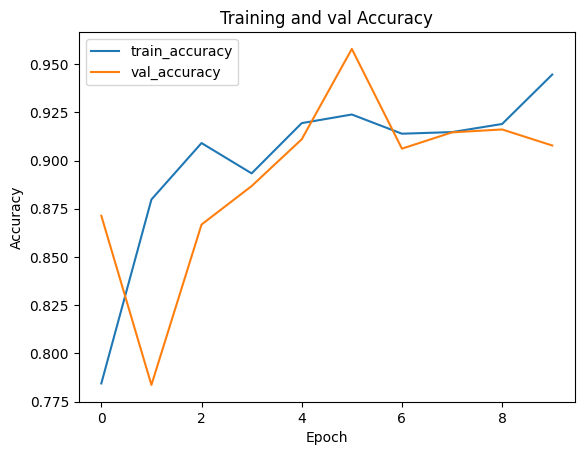

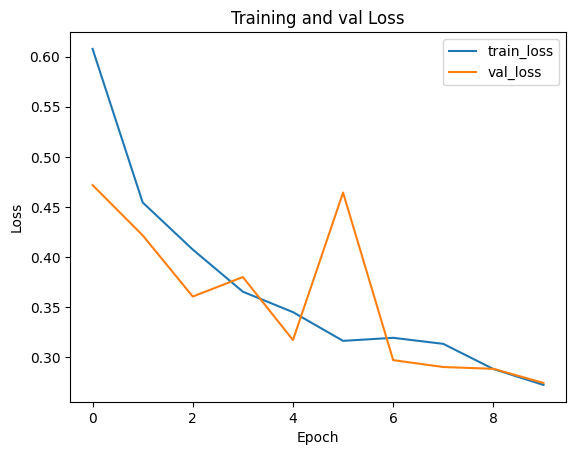

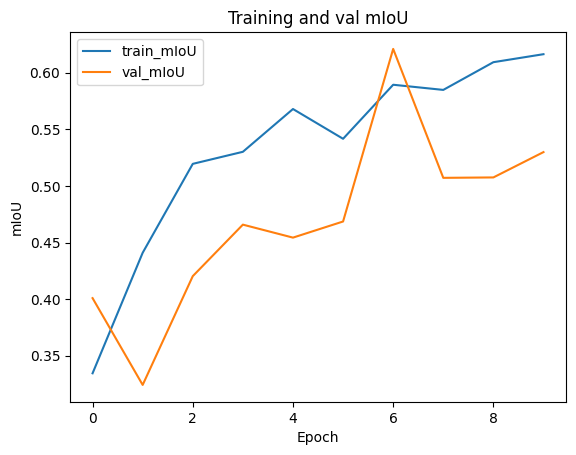

In [18]:
plt.figure()
plt.plot(train_accuracies, label="train_accuracy")
plt.plot(val_accuracies, label="val_accuracy")
plt.legend()

plt.xlabel('Epoch')
plt.ylabel('Accuracy')

plt.title('Training and val Accuracy')

plt.figure()
plt.plot(train_losses, label="train_loss")
plt.plot(val_losses, label="val_loss")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and val Loss')

plt.figure()
plt.plot(train_mIoUs, label="train_mIoU")
plt.plot(val_mIoUs, label="val_mIoU")

plt.legend()
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('Training and val mIoU')

Loading CheckPoint

In [11]:
# Loading all variables from a checkpoint to continue a training

# Path to checkpoint
#last model
saved_checkpoint_path = '/content/drive/MyDrive/A3/checkpoints/checkpoint_norm_aug_tensorboard.pth'
#best model
#saved_checkpoint_path = '/content/drive/MyDrive/CV A2/best_val_checkpoint_norm_aug_tensorboard.pth'

# Load the checkpoint
checkpoint = torch.load(saved_checkpoint_path,map_location=torch.device('cpu'))
print(checkpoint.keys())

# Load all the state_dictionaries of the model, optimizer and schedular
model.load_state_dict(checkpoint['model'])

optimizer.load_state_dict(checkpoint['optimizer'])

scheduler.load_state_dict(checkpoint['scheduler'])

# Epoch to continue from the last training
start_epoch = checkpoint['trianed_epochs'] + 1

train_accuracies = checkpoint['train_accuracies']
val_accuracies = checkpoint['val_accuracies']

train_losses = checkpoint['train_losses']
val_losses = checkpoint['val_losses']

train_mIoUs = checkpoint['train_mIoUs']
val_mIoUs = checkpoint['val_mIoUs']

val_mIoU_max = checkpoint['val_accuracy_max']



dict_keys(['model', 'optimizer', 'scheduler', 'trianed_epochs', 'train_losses', 'train_accuracies', 'train_mIoUs', 'val_losses', 'val_accuracies', 'val_accuracy_max', 'val_mIoUs', 'lr'])


Loading best Model

In [13]:
best_val_model_path = '/content/drive/MyDrive/A3/checkpoints/best_val_checkpoint_norm_aug_tensorboard.pth'
best_val_checkpoint = torch.load(best_val_model_path, map_location=torch.device(device))
# Before loading the state_dict of the model, make sure the "model" instance is 
# initiated by its corresponding class e.g. MObilenet
model.load_state_dict(best_val_checkpoint['model'])

<All keys matched successfully>

Testing Loop

In [12]:

import torch.nn.functional as F

import torch


# Assuming you have the predicted masks and true labels as tensors



def run_testing(model, loss_fn, loader):
    model.eval()
    total_loss = 0
    total_correct_preds = 0
    total_samples_in_loader = len(loader.dataset)
    total_batches_in_loader = len(loader)

    predicted_masks = []
    images = []
    true_label = []
    mean_iou_list = []
    accuracy_list = []

    with torch.no_grad():
        for image_batch, labels in tqdm(loader):
            image_batch = image_batch.permute(0, 3, 1, 2)
            image_batch = image_batch.to(device)
            labels_long = labels
            labels_long = labels_long.long()

            
            labels_long = labels_long.to(device)

            labels = labels.to(device)
            output = model(image_batch.float())
            loss = loss_fn(output, labels_long)
            _, predicted = torch.max(output.data, 1)
            total_loss += loss.item()
            true_label.append(labels.cpu())
            predicted_masks.append(torch.Tensor(predicted).float().cpu())
            images.append(image_batch.cpu())
            accuracy = pixel_accuracy(output.cpu(), labels.cpu())
            mean_IoU = mIoU(output.float().cpu(), labels.cpu())
            mean_iou_list.append(mean_IoU)
            accuracy_list.append(accuracy)

        
        loss = total_loss / total_batches_in_loader
        

    return loss, accuracy_list, mean_iou_list, predicted_masks,true_label, images


In [19]:
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
images, masks= next(iter(test_dataloader))
# Print the shape of the images and labels
print(images.shape)
print(masks.shape)


torch.Size([8, 288, 288, 3])
torch.Size([8, 288, 288])


In [20]:
loss_list, accuracy_list, mean_iou_list, predicted_masks,true_mask, images_test = run_testing(model,loss_function ,test_dataloader)

print(loss_list)
print(accuracy_list)
print(mean_iou_list)


  0%|          | 0/13 [00:00<?, ?it/s]

0.31462486202900225
[0.9314567660108025, 0.9127031491126543, 0.9187629605516975, 0.9130588107638888, 0.9017846378279321, 0.9256998697916666, 0.9145206404320988, 0.9063328872492284, 0.8883282696759259, 0.8697871455439815, 0.8765673225308642, 0.9111629533179012, 0.9178747106481482]
[0.5785160197131168, 0.5582254422166764, 0.5708172900181893, 0.6018537771586165, 0.6187742538580366, 0.6585269648397339, 0.6426911001552638, 0.6073262335634654, 0.6251896594070566, 0.5014378061800764, 0.5056970020560861, 0.5259322821851492, 0.5292772684810539]


Performace measures

Text(0.5, 1.0, 'Testing mIoU')

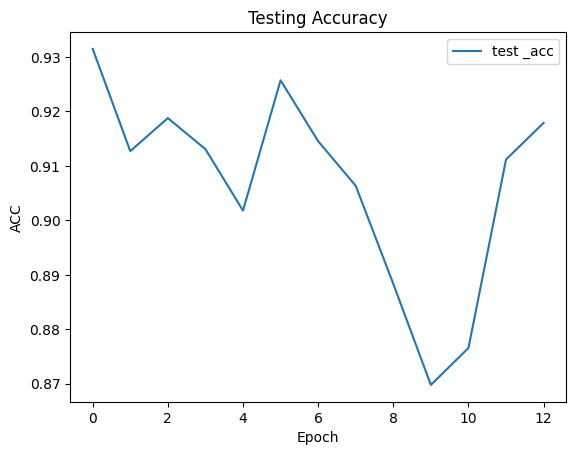

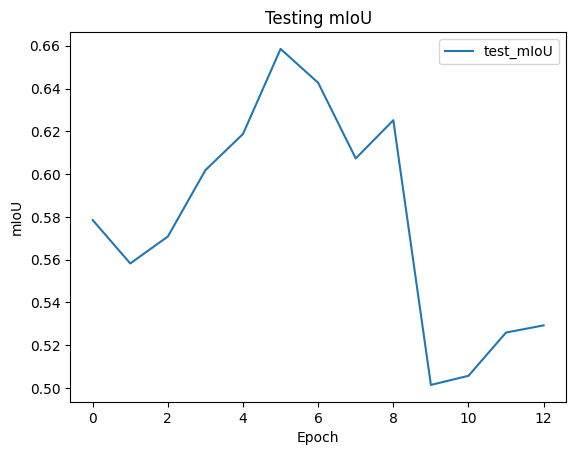

In [23]:
plt.figure()
plt.plot(accuracy_list, label="test _acc")

plt.xlabel('Epoch')
plt.ylabel('ACC')
plt.legend()
plt.xlabel('Epoch')

plt.title('Testing Accuracy')

plt.figure()
plt.plot(mean_iou_list, label="test_mIoU")


plt.legend()
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('Testing mIoU')

In [21]:
#performance Metrices
import statistics
avg_accuracy = statistics.mean(accuracy_list)
avg_mIou = statistics.mean(mean_iou_list)

print(avg_accuracy)

0.9067723171889839


In [22]:
from sklearn.metrics import roc_curve
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
import pandas as pd

def VisualizeResults(y_true,y_pred):
  #confusion Matrix
  cm = confusion_matrix(y_true, y_pred)
  plt.figure(figsize=(10, 10))

  # Create the heatmap
  sns.heatmap(cm, annot=True, fmt='.0f', cmap="Blues")
  plt.title("Confusion Matrix")
  plt.ylabel("True Label")
  plt.xlabel("Predicted Label")

  # Display the plot
  plt.show(block=False)

  # Assuming you have the classification report as a dictionary
  cr_dict = classification_report(y_true, y_pred, output_dict=True)
  cr_df = pd.DataFrame(cr_dict).transpose()

  # Set a larger figure size
  plt.figure(figsize=(18, 10))

  # Create the heatmap
  sns.heatmap(cr_df.iloc[:-1, :].T, annot=True, fmt='.2f', cmap="Blues")
  plt.title("Classification Report")

  # Display the plot
  plt.show(block=False)
  return cm

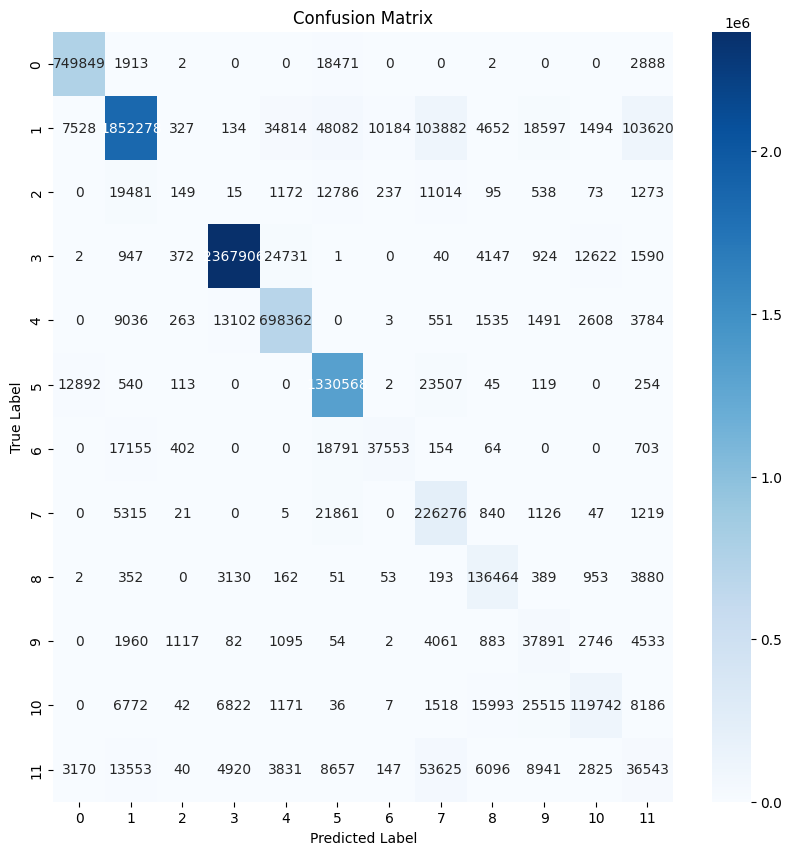

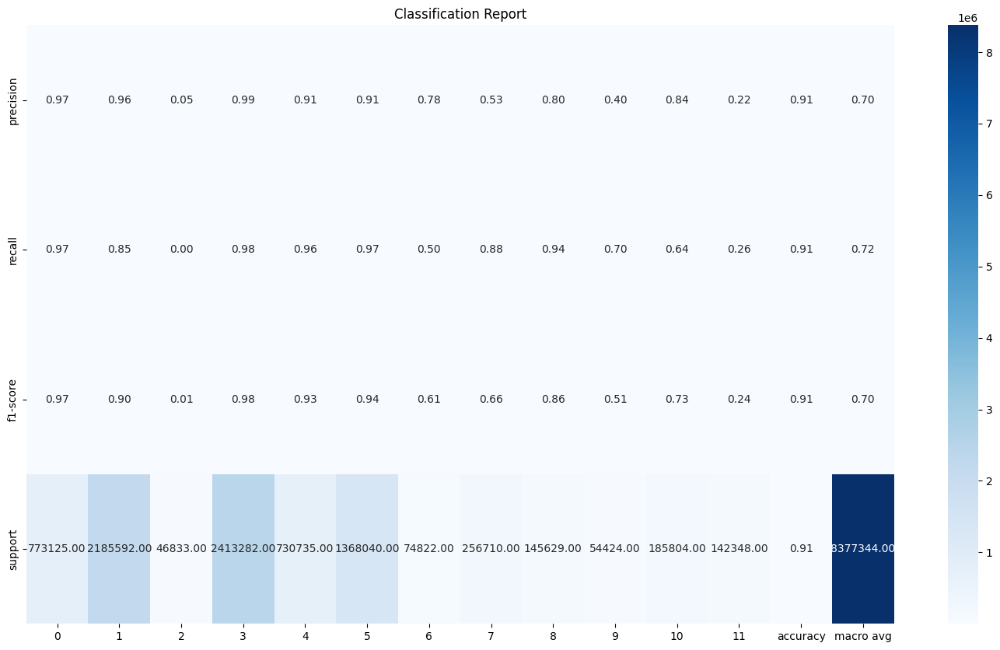

In [23]:
from sklearn.metrics import f1_score


# Flatten the masks into 1D arrays if needed
predicted_masks_flat = torch.cat(predicted_masks,dim=0)
true_masks_flat = torch.cat(true_mask,dim=0)
predicted_masks_flat = predicted_masks_flat.flatten()
true_masks_flat = true_masks_flat.flatten()
images_test_flat = torch.cat(images_test,dim=0)


# Calculate the F1 score
cm=VisualizeResults(true_masks_flat, predicted_masks_flat)



In [27]:
import numpy as np

def dice_coefficient(confusion_matrix, class_label):
    true_positive = confusion_matrix[class_label, class_label]
    false_positive = np.sum(confusion_matrix[:, class_label]) - true_positive
    false_negative = np.sum(confusion_matrix[class_label, :]) - true_positive
    
    dice = (2.0 * true_positive) / (2.0 * true_positive + false_positive + false_negative)
    return dice

def sensitivity(confusion_matrix, class_label):
    true_positive = confusion_matrix[class_label, class_label]
    false_negative = np.sum(confusion_matrix[class_label, :]) - true_positive
    
    sens = true_positive / (true_positive + false_negative)
    return sens

def specificity(confusion_matrix, class_label):
    true_negative = np.sum(np.delete(np.delete(confusion_matrix, class_label, axis=0), class_label, axis=1))
    false_positive = np.sum(confusion_matrix[:, class_label]) - confusion_matrix[class_label, class_label]
    
    spec = true_negative / (true_negative + false_positive)
    return spec

# Assuming you have the predicted masks and true labels as PyTorch tensors


# # Convert tensors to numpy arrays
# predicted_masks = predicted_masks.numpy()
# true_labels = true_labels.numpy()

# Compute the confusion matrix
num_classes = 12
confusion_matrix = cm

# Calculate the metrics for each class
dice_scores = []
sensitivity_scores = []
specificity_scores = []
for class_label in range(num_classes):
    dice = dice_coefficient(confusion_matrix, class_label)
    sensitivity_score = sensitivity(confusion_matrix, class_label)
    specificity_score = specificity(confusion_matrix, class_label)
    dice_scores.append(dice)
    sensitivity_scores.append(sensitivity_score)
    specificity_scores.append(specificity_score)

# Print the results for each class
for class_label in range(num_classes):
    print(f"Class {class_label}:")
    print("Dice coefficient:", dice_scores[class_label])
    print("Sensitivity:", sensitivity_scores[class_label])
    print("Specificity:", specificity_scores[class_label])
    print()


Class 0:
Dice coefficient: 0.9696941873878161
Sensitivity: 0.9698936135812449
Specificity: 0.9968972487509894

Class 1:
Dice coefficient: 0.9002798127971219
Sensitivity: 0.8474948663794524
Specificity: 0.9875602252803407

Class 2:
Dice coefficient: 0.00599826895593889
Sensitivity: 0.0031815173061729976
Specificity: 0.9996760102711586

Class 3:
Dice coefficient: 0.9847005640836588
Sensitivity: 0.9811973901102317
Specificity: 0.9952708405781161

Class 4:
Dice coefficient: 0.9335903609303793
Sensitivity: 0.9556980300656188
Specificity: 0.9912404308890386

Class 5:
Dice coefficient: 0.9411961103459788
Sensitivity: 0.9726089880412854
Specificity: 0.9816258504410709

Class 6:
Dice coefficient: 0.6105682464840256
Sensitivity: 0.501897837534415
Specificity: 0.9987190639181684

Class 7:
Dice coefficient: 0.6640226196607344
Sensitivity: 0.881445989638113
Specificity: 0.9755505543040113

Class 8:
Dice coefficient: 0.8624816318791575
Sensitivity: 0.93706610633871
Specificity: 0.9958268720430675

C

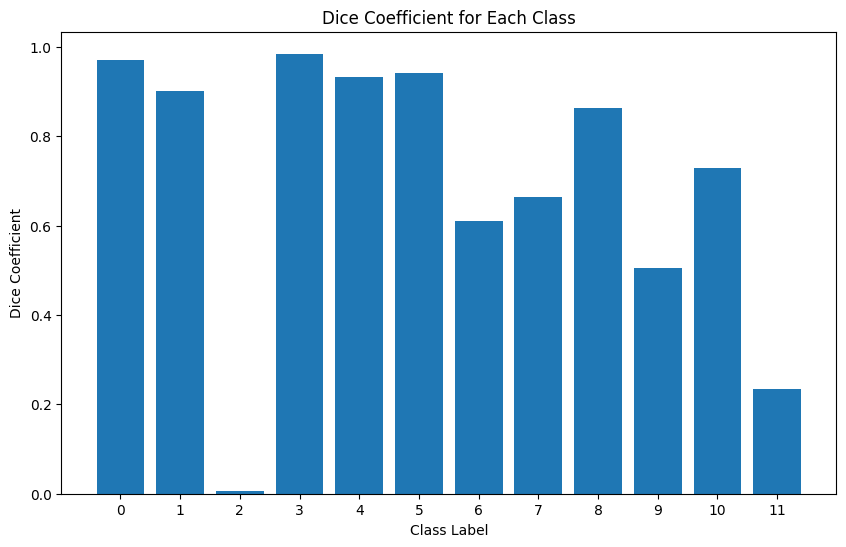

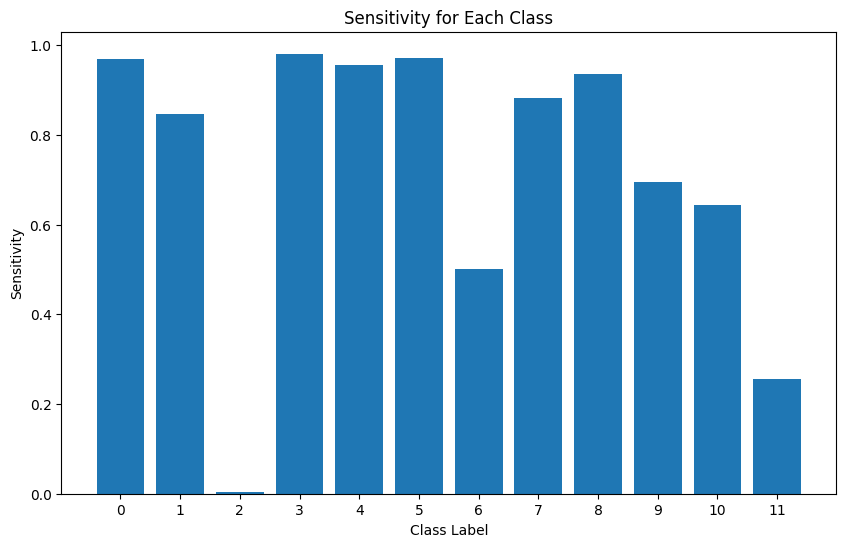

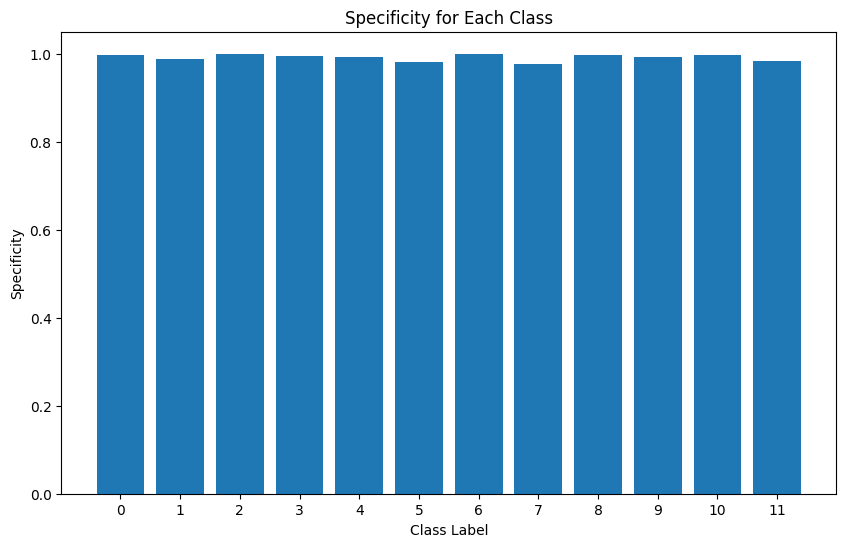

In [30]:
import matplotlib.pyplot as plt

# Assuming you have calculated the dice_scores, sensitivity_scores, and specificity_scores for each class

# Create a list of class labels for the x-axis
class_labels = list(range(num_classes))

# Plot the Dice coefficients
plt.figure(figsize=(10, 6))
plt.bar(class_labels, dice_scores)
plt.xlabel('Class Label')
plt.ylabel('Dice Coefficient')
plt.title('Dice Coefficient for Each Class')
plt.xticks(class_labels)
plt.show()

# Plot the sensitivity scores
plt.figure(figsize=(10, 6))
plt.bar(class_labels, sensitivity_scores)
plt.xlabel('Class Label')
plt.ylabel('Sensitivity')
plt.title('Sensitivity for Each Class')
plt.xticks(class_labels)
plt.show()

# Plot the specificity scores
plt.figure(figsize=(10, 6))
plt.bar(class_labels, specificity_scores)
plt.xlabel('Class Label')
plt.ylabel('Specificity')
plt.title('Specificity for Each Class')
plt.xticks(class_labels)
plt.show()


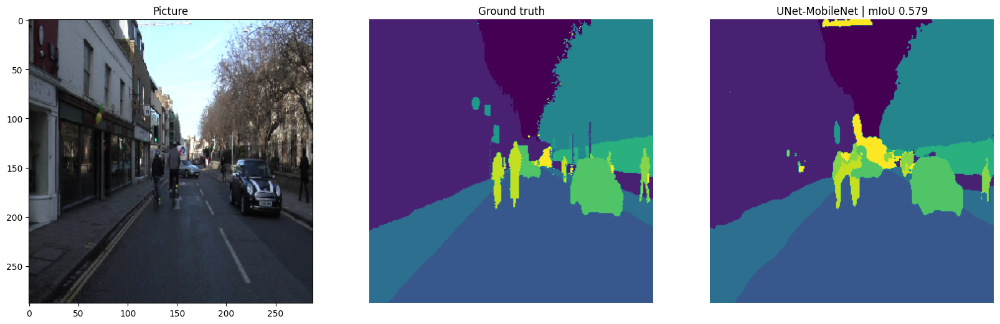

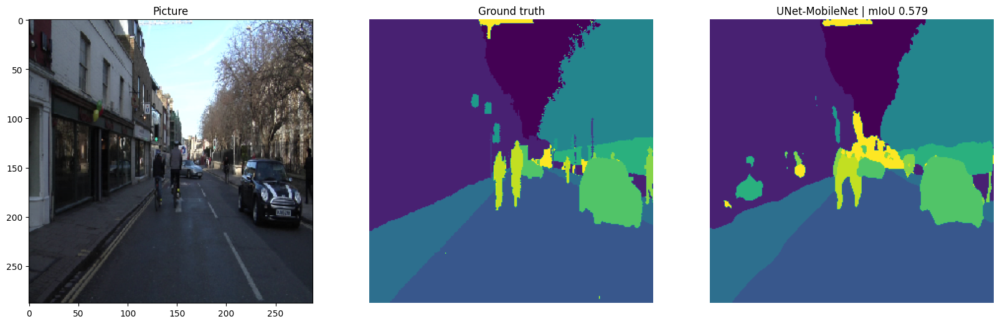

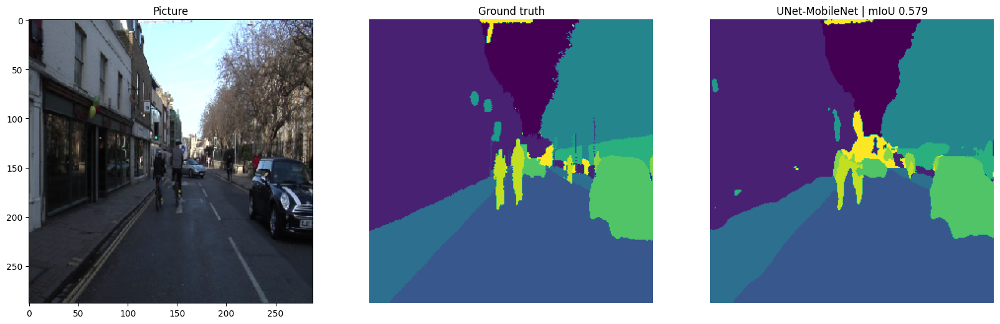

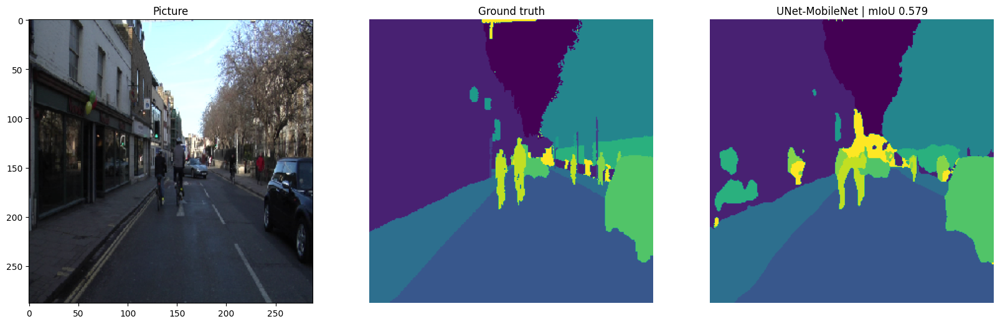

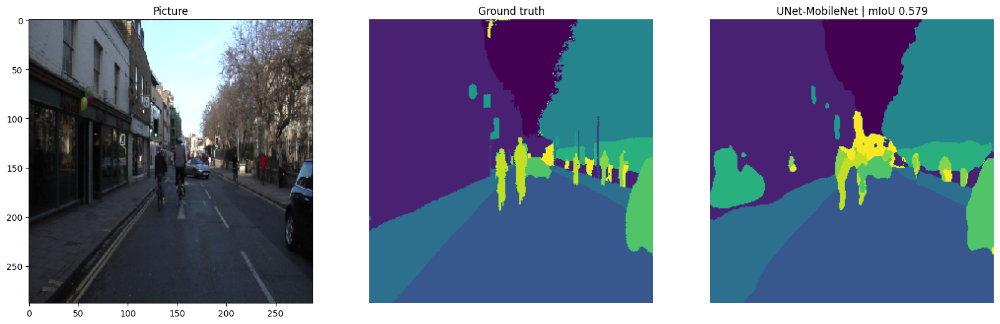

...

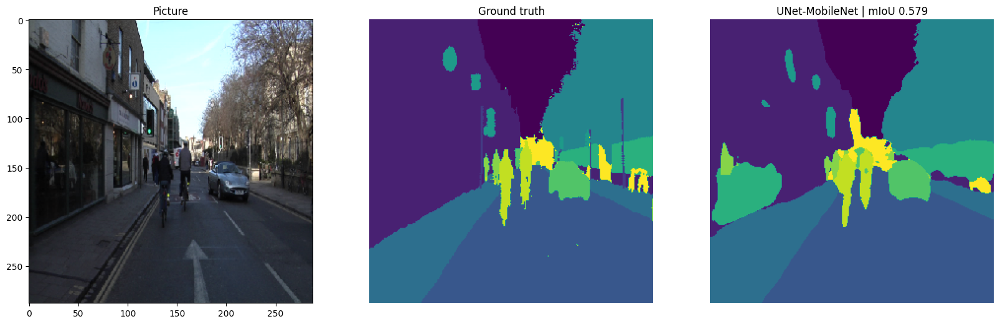

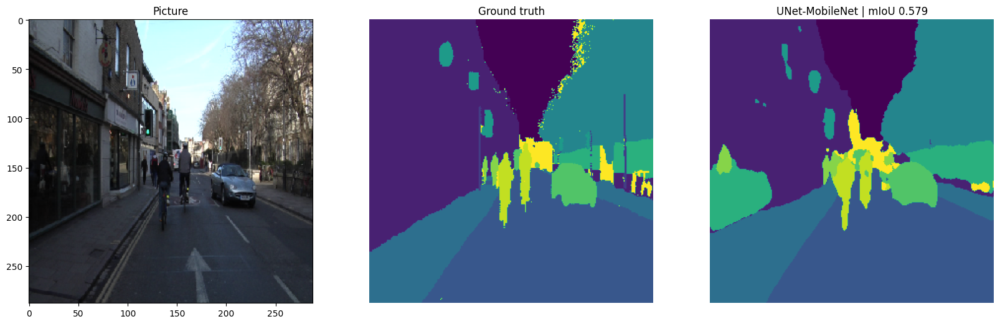

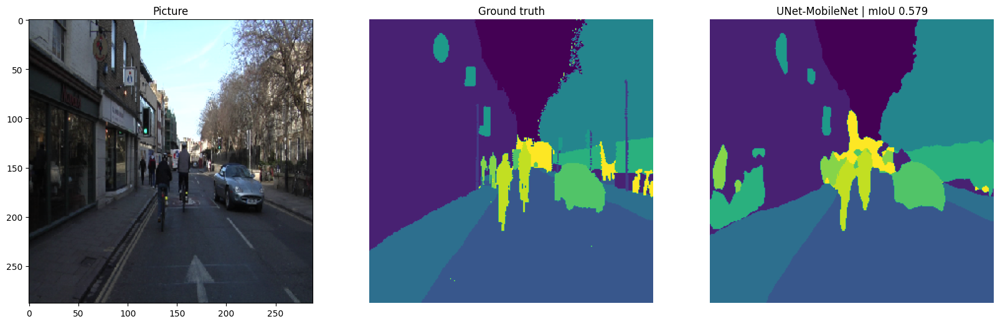

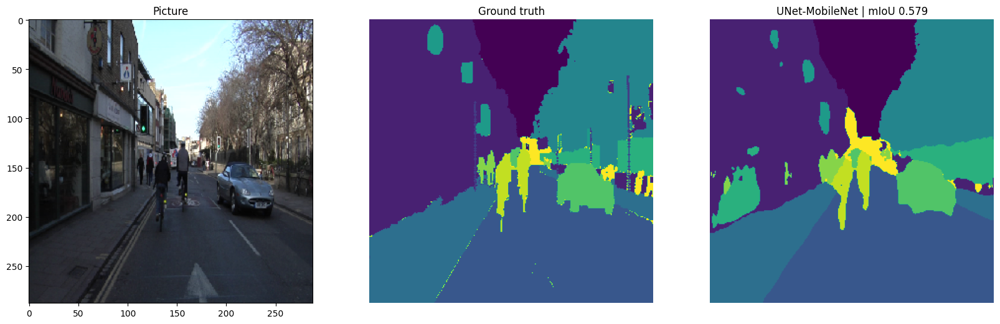

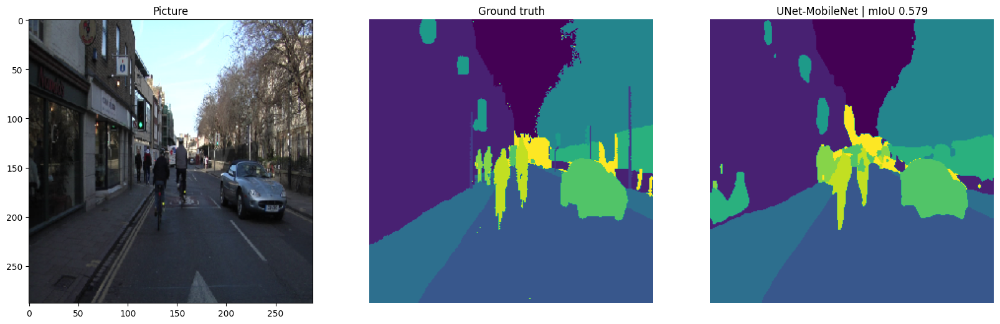

In [29]:
import matplotlib.pyplot as plt
import numpy as np

def display_for_comparison(image, true_mask, pred_mask):
    image = np.transpose(image, (1, 2, 0))  # Transpose image to (height, width, channels)
  
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))
    ax1.imshow(image)
    ax1.set_title('Picture')

    ax2.imshow(true_mask)
    ax2.set_title('Ground truth')
    ax2.set_axis_off()

    ax3.imshow(pred_mask)
    ax3.set_title('UNet-MobileNet | mIoU {:.3f}'.format(avg_mIou))
    ax3.set_axis_off()
    plt.show()


# Assuming you have predicted_masks_flat, true_masks_flat, and images_test_flat from your code

# Reshape predicted_masks_flat and true_masks_flat if needed
predicted_masks_flat = predicted_masks_flat.reshape(-1, 288, 288)  # Adjust the shape based on your data
true_masks_flat = true_masks_flat.reshape(-1, 288, 288)  # Adjust the shape based on your data

# Display image comparisons
for i in range(0,40,2):
    pred_mask = predicted_masks_flat[i]
    true_mask = true_masks_flat[i]
    image = images_test_flat[i]
    #score = mean_iou_list[i]

    display_for_comparison(image, true_mask, pred_mask)


In [45]:
len(mean_iou_list)

13

In [46]:
len(images_test_flat)

101